In [1]:
import matplotlib.pyplot as plt

import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

import numpy as np
import os
import random
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.optim.lr_scheduler as sched
import wandb

from dawgz import job, after, ensure, schedule
from itertools import chain, islice
from pathlib import Path
from torch import Tensor
Tensor
from tqdm import tqdm
from typing import *
import pandas as pd

from lampe.data import H5Dataset
from zuko.distributions import BoxUniform
from lampe.inference import NPE, NPELoss
from lampe.nn import ResMLP
from zuko.flows import NAF, NSF, MAF, NCSF, SOSPF, UNAF, CNF 
from lampe.plots import nice_rc, corner, coverage_plot, mark_point
from lampe.utils import GDStep

import sys
sys.path.insert(0, '/home/mvasist/Highres/simulations/')
from DataProcuring import Data 
from ProcessingSpec import ProcessSpec
from parameter import *
from spectra_simulator import SpectrumMaker
from parameter_set_script import param_set, param_list, param_list_ext, param_set_ext, deNormVal
# from spectra_simulator import Simulator, LOWER, UPPER
# from AverageEstimator import avgestimator

# sys.path.insert(0, '/home/mvasist/Highres/sbi/added_scripts/')
from added_scripts.corner_modified import *
from added_scripts.pt_plotting import *


# from ees import Simulator, LOWER, UPPER, LABELS, pt_profile
LABELS, LOWER, UPPER = zip(*[
[                  r'$FeH$',  -1.5, 1.5],   # temp_node_9
[                  r'$CO$',  0.1, 1.6],  # CO_mol_scale
[                  r'$\log g$',   2.5, 5.5],          # log g
[                  r'$Tint$',  300,   3500],   # temp_node_5
[                  r'$T1$',  300,   3500],      # T_bottom
[                  r'$T2$',  300,   3500],   # temp_node_1
[                  r'$T3$',  300,   3500],   # temp_node_2
[                  r'$alpha$',  1.0, 2.0],   # temp_node_4
[                  r'$log_delta$', 3.0, 8.0],   # temp_node_3
[                  r'$log_Pquench$', -6.0, 3.0],   # temp_node_6
# [                  r'$logFe$',  -2.3, 1.0], # CH4_mol_scale
# [                  r'$fsed$',  0.0, 10.0],   # temp_node_8
# [                  r'$logKzz$',  5.0, 13.0], # H2O_mol_scale \_mol\_scale
# [                  r'$sigmalnorm$',  1.05, 3.0], # C2O_mol_scale
[                  r'$log\_iso\_rat$',  -11.0, -1.0],   # temp_node_7
[                  r'$R\_P$', 0.8, 2.0],             # R_P / R_Jupyter
[                  r'$rv$',  10.0, 30.0], # NH3_mol_scale 20, 35
[                  r'$vsini$', 0.0, 50 ], # H2S_mol_scale 10.0, 30.0
[                  r'$limb\_dark$',  0.0, 1.0], # PH3_mol_scale
[                  r'$b$',  1, 20.0], # PH3_mol_scale

])

os.environ['SCRATCH'] = os.path.join('/scratch/users/mvasist/')
scratch = os.environ['SCRATCH']
datapath = Path(scratch) / 'highres-sbi/data_nic5'
savepath = Path(scratch) / 'highres-sbi/runs/sweep_lognormnoise'

processing = ProcessSpec()
d = Data()
sim = SpectrumMaker(wavelengths=d.model_wavelengths, param_set=param_set, lbl_opacity_sampling=2)


def simulator(theta):
    values = theta[:-4].numpy()
    values_ext = theta[-4:].numpy()
    # print(values, values_ext)
    values_actual = deNormVal(values, param_list)
    spectrum = sim(values_actual)
    spec = np.vstack((np.array(spectrum), d.model_wavelengths))
    
    values_ext_actual = deNormVal(values_ext, param_list_ext)
    # params_ext = param_set_ext.param_dict(values_ext_actual)
    
    th, x = processing(torch.Tensor([values_actual]), torch.Tensor(spec), sample= False, \
                       values_ext_actual= torch.Tensor([values_ext_actual]))
    # print(np.shape(x))
    return x.squeeze()


## Loading from a model to plot logNormnoise_15
CONFIGS = {'embedding': 'shallow', 'flow': 'MAF', 'transforms': 3, 'hidden_features': 512, 'hidden_features_no': 5, 'activation': 'torch.nn.modules.activation.ELU', 'optimizer': 'AdamW', 'init_lr': 0.001, 'weight_decay': 0, 'scheduler': 'ReduceLROnPlateau', 'min_lr': 1e-08, 'patience': 16, 'epochs': 2001, 'stop_criterion': 'early', 'batch_size': 2048, 'spectral_length': 6144, 'factor': 0.5, 'noise': 'lognormaldist', 'gradient_steps_train': 1024, 'gradient_steps_valid': 256, 'ndim': 16}


DataProcuring


/home/mvasist/miniconda3/envs/HighResear/lib/python3.9/site-packages/petitRADTRANS/radtrans.py:113: FutureWarning: pRT_input_data_path was set by an environment variable. In a future update, the path to the petitRADTRANS input_data will be set within a .ini file that will be automatically generated into the user home directory (OS agnostic), inside a .petitradtrans directory
  warnings.warn(f"pRT_input_data_path was set by an environment variable. In a future update, the path to "


  Read line opacities of H2O_main_iso...
 Done.
  Read line opacities of CO_main_iso...
 Done.
  Read line opacities of CO_36...
 Done.

  Read CIA opacities for H2-H2...
  Read CIA opacities for H2-He...
Done.

  Read line opacities of H2O_main_iso...
 Done.
  Read line opacities of CO_main_iso...
 Done.
  Read line opacities of CO_36...
 Done.

  Read CIA opacities for H2-H2...
  Read CIA opacities for H2-He...
Done.



In [2]:
d = Data()

In [3]:
# x_star =  torch.Tensor(np.loadtxt('/home/mvasist/Highres/observation/simulated_obs/x_sim_b.npy'))[0]
# theta_star = torch.Tensor(np.loadtxt('/home/mvasist/Highres/observation/simulated_obs/theta_sim_b.npy'))

In [4]:
# plt.rcParams.update(nice_rc(latex=True))
# plt.figure(figsize=(15,7))
# # plt.errorbar(x[0, 1], x[0,0], yerr= d.err**d.flux_scaling*25, color = 'steelblue', label = 'betsfit')
# plt.plot(d.data_wavelengths_norm, d.flux*d.flux_scaling, color = 'black')
# plt.xlabel('Wavelength (mu)', fontsize = 20)
# plt.ylabel('Planet flux Fv (meanflux Wm-2 um-1)', fontsize= 20)
# plt.show()

## Sam's corner plot

In [5]:
## Sam's retrieval

# Sam's param list
# ["R_pl", "log_g", "v_sini", "rv", "C/O", "Fe/H", "log_P_quench", "T_0", "T_1", "T_2", "T_3"]


theta_sam = torch.load('/home/mvasist/Highres/Sam/Model_2/Mine/posterior.pth')

## MY corner plot

In [3]:
scratch = os.environ.get('SCRATCH', '')
datapath = Path(scratch) / 'highres-sbi/runs/sweep_lognormnoise' 

runpath = datapath / 'logNormnoise_15' #'honest-totem-81'
ep = 600
savepath = runpath/ ('plots_' + str(ep))


In [4]:
df_theta = pd.read_csv(savepath/'theta.csv')
theta = df_theta.values
theta = torch.from_numpy(theta)
# theta = theta*(torch.Tensor(UPPER)-torch.Tensor(LOWER)) + torch.Tensor(LOWER)


In [5]:
theta[:29910,-1]

tensor([2.4317, 2.6686, 1.0045,  ..., 2.5491, 1.7599, 2.1184],
       dtype=torch.float64)

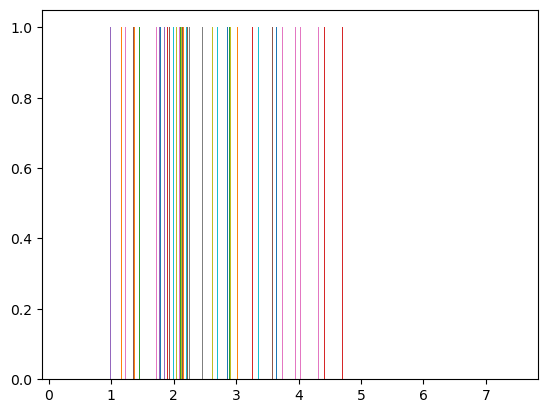

In [9]:
plt.hist(theta[:29910,-1])
plt.show()

In [10]:
th_df = pd.DataFrame(theta[:2991])

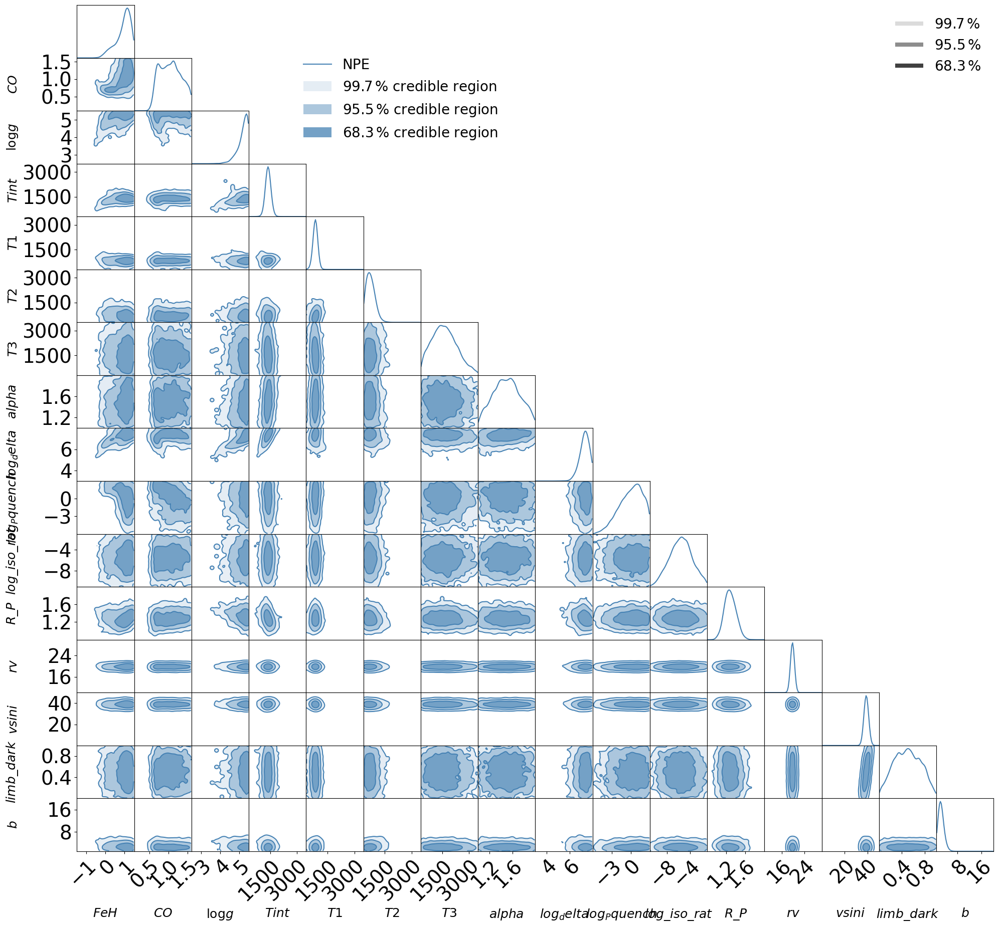

In [11]:
corner_mod([th_df.values], legend=['NPE'], \
                color= ['steelblue'] , figsize=(20,20), \
             domain = (LOWER, UPPER), labels= LABELS) #

plt.show()

In [12]:
# ["R_pl", "log_g", "v_sini", "rv", "C/O", "Fe/H", "log_P_quench", "T_0", "T_1", "T_2", "T_3"]

LABELS

('$FeH$',
 '$CO$',
 '$\\log g$',
 '$Tint$',
 '$T1$',
 '$T2$',
 '$T3$',
 '$alpha$',
 '$log_delta$',
 '$log_Pquench$',
 '$log\\_iso\\_rat$',
 '$R\\_P$',
 '$rv$',
 '$vsini$',
 '$limb\\_dark$',
 '$b$')

In [13]:
th_df_ = th_df.drop( columns= [7, 8, 10, 14, 15 ], axis=1)

In [14]:
th_df_

,0,1,2,3,4,5,6,9,11,12,13
0,-0.001771,0.684657,5.245611,1233.796291,858.102892,1419.933779,1633.410893,3.855234,1.150481,19.584996,38.690424
1,0.943559,0.989921,5.160199,1479.294566,813.752839,428.766677,1045.281942,2.235985,1.267071,19.560580,39.027300
2,1.413485,0.938230,5.788994,1333.821775,818.304035,348.831512,277.060019,-1.067792,1.345349,19.955780,37.809744
3,1.005183,1.367499,5.648024,1418.033590,887.168104,739.676505,797.401547,1.971176,1.138738,19.359604,37.877177
4,0.813290,0.951991,5.713833,1398.659052,704.419858,314.875439,1698.131296,1.188043,1.104813,20.021025,38.015585
...,...,...,...,...,...,...,...,...,...,...,...
2986,1.334854,0.873586,5.650215,1388.647107,864.486186,604.515292,1905.322056,0.377501,1.343684,19.332497,38.274014
2987,1.112356,0.511641,5.344484,1336.555968,820.664157,484.380202,935.366403,-1.332412,1.377952,19.314300,39.660552
2988,1.301034,1.102181,5.774713,1304.762567,687.711946,177.267319,2243.659202,0.148286,1.259146,19.742572,39.544233
2989,0.134355,0.556198,5.030651,1291.920942,721.300914,485.775110,1821.639449,1.519546,1.219115,19.217045,38.877193


In [15]:
th_df_sam = pd.DataFrame(theta_sam)
th_df_sam

,0,1,2,3,4,5,6,7,8,9,10
0,-0.272065,0.591780,5.282395,4693.238451,860.049283,609.558991,454.994112,1.070353,0.776357,22.660049,40.304610
1,-0.238464,0.598246,5.387477,4543.503664,839.246057,573.862761,406.742978,1.088092,0.742900,22.727753,40.434223
2,-0.237104,0.586893,5.403715,4907.756860,911.815268,651.660774,382.113669,1.048728,0.743326,22.531423,40.406156
3,-0.240041,0.593008,5.353033,4734.564451,915.860767,643.820093,441.451895,1.087330,0.760046,22.548198,40.827446
4,-0.248391,0.596758,5.344306,4929.544805,936.460389,684.256503,347.208668,1.082181,0.768861,22.610494,40.335625
...,...,...,...,...,...,...,...,...,...,...,...
2986,-0.255831,0.593136,5.357171,4986.721087,892.939740,721.482021,609.619350,1.100856,0.774048,22.690843,40.307774
2987,-0.258578,0.592480,5.362988,4962.407482,885.100065,717.367477,700.463946,1.096769,0.772318,22.686487,40.308205
2988,-0.256215,0.591639,5.363198,4982.992206,890.195266,720.494781,670.292380,1.086168,0.769250,22.614232,40.305318
2989,-0.252826,0.594536,5.354802,4974.497128,881.461690,730.565203,712.703562,1.088712,0.772668,22.640976,40.269166


In [16]:
# 7, 8, 10, 14, 15
idx = [0,1,2,3,4,5,6,9,11,12,13]
labels_ind = [LABELS[i] for i in idx]


In [17]:
# fig = corner_mod([th_df_.values, theta_sam], legend=['NPE', 'MultiNest'], \
#                     color= ['steelblue', 'orange'] , figsize=(12,12), \
#                  domain = (LOWER, UPPER), labels= LABELS) #

## comparing with Sam

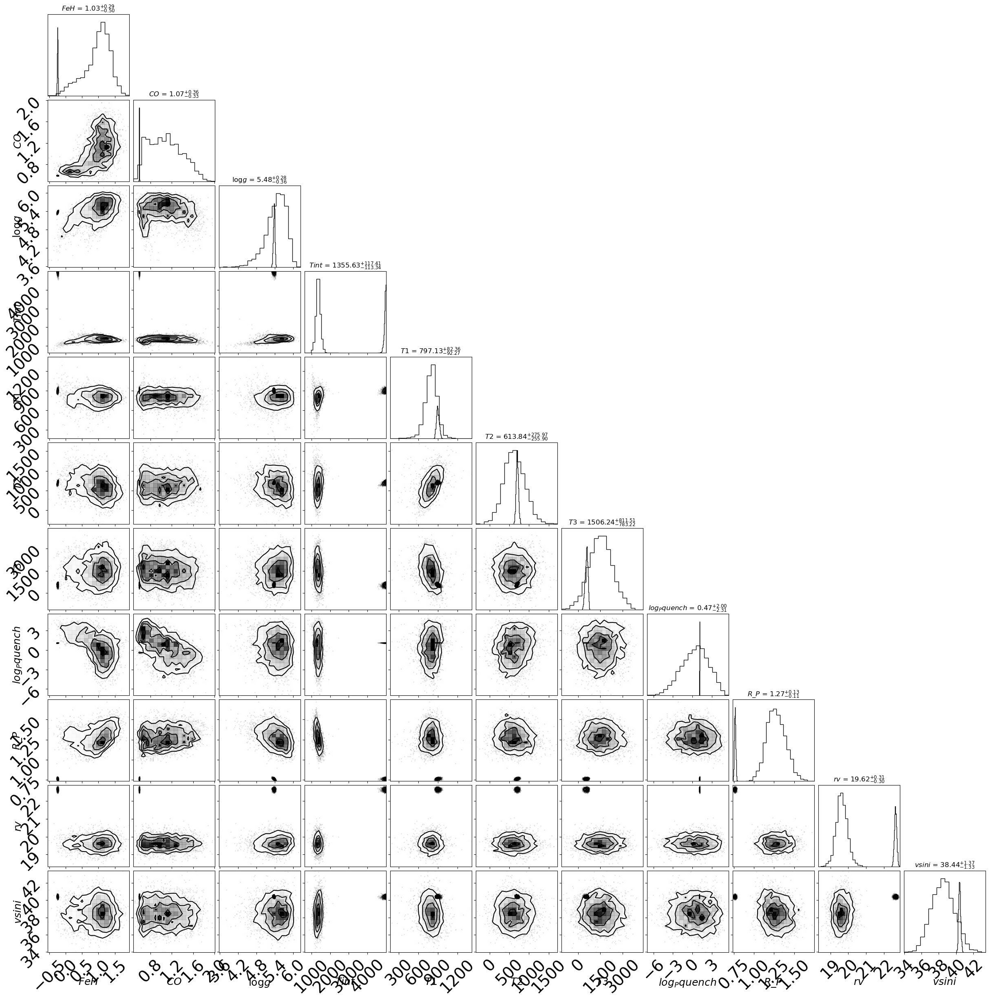

In [18]:
from corner import corner

fig = corner(th_df_.values, labels = labels_ind, show_titles=True,
    title_kwargs={"fontsize": 12})
corner(th_df_sam.values, fig=fig)
plt.show()

## comparing diff runs with Sam

/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_5/plots_200


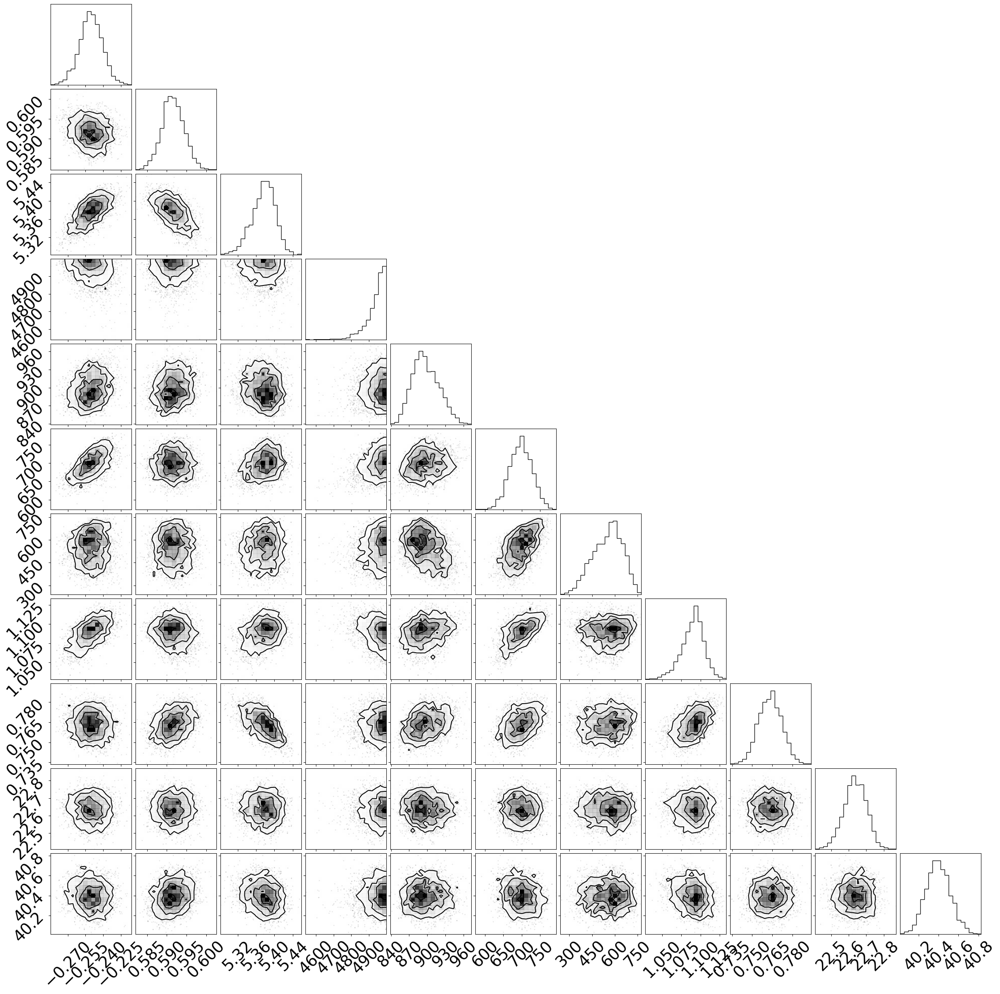

In [19]:
from corner import corner

colors = ['orange', 'red', 'purple', 'blue', 'green', 'darkgreen', 'steelblue', 'pink']
figure = None


epochs = [200, 600, 200, 500, 300, 600, 600, 500]
for j, i in enumerate([ 5, 15, 8, 9, 10, 11, 13, 18]):
    runpath = datapath / ('logNormnoise_'+ str(i)) #'honest-totem-81'
    ep = epochs[j]
    savepath = runpath/ ('plots_' + str(ep))
    print(savepath)

    df_theta = pd.read_csv(savepath/'theta.csv')
    theta = df_theta.values
    theta = torch.from_numpy(theta)
#     print(theta)
    th_df = pd.DataFrame(theta[:2991])
    
    th_df_ = th_df.drop( columns= [7, 8, 10, 14, 15 ], axis=1)
    corner(th_df_.values, fig=figure, color = colors[j], labels = labels_ind, show_titles=True,
    title_kwargs={"fontsize": 12})
#     break
    
corner(th_df_sam.values, fig=figure, color = 'black')
plt.show()

## Only rv and vsini

/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_5/plots_200
/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_8/plots_200
/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_9/plots_500


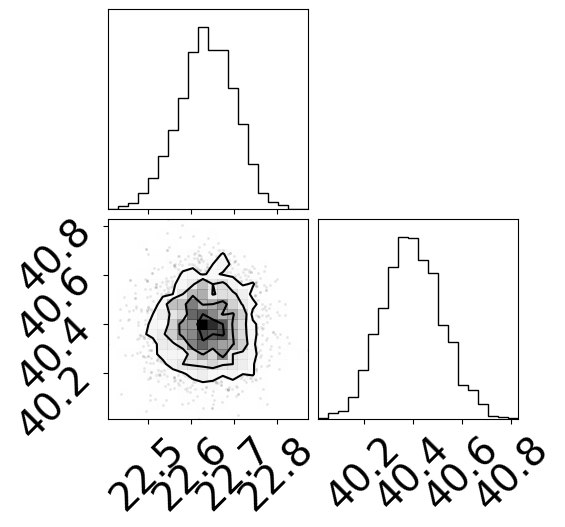

In [20]:
from corner import corner

colors = ['orange', 'red', 'purple', 'blue', 'green', 'darkgreen', 'steelblue', 'pink']
figure = None

epochs = [ 200, 200, 500, 300, 600, 600, 300, 500]
for j, i in enumerate([ 5, 8, 9, 10, 11, 13, 15, 18]):
    runpath = datapath / ('logNormnoise_'+ str(i)) #'honest-totem-81'
    ep = epochs[j]
    savepath = runpath/ ('plots_' + str(ep))
    print(savepath)

    df_theta = pd.read_csv(savepath/'theta.csv')
    theta = df_theta.values
    theta = torch.from_numpy(theta)
#     print(theta)
    th_df = pd.DataFrame(theta[:2991])
    
    th_df_ = th_df.drop( columns= [7, 8, 10, 14, 15 ], axis=1)
    corner(th_df_.values[:,-2:], fig=figure, color = colors[j], labels = labels_ind[-2:], show_titles=True,
    title_kwargs={"fontsize": 12})
    
    if j > 1:
        break
    
corner(th_df_sam.values[:,-2:], fig=figure, color = 'black')
plt.show()

## only b

/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_15/plots_600


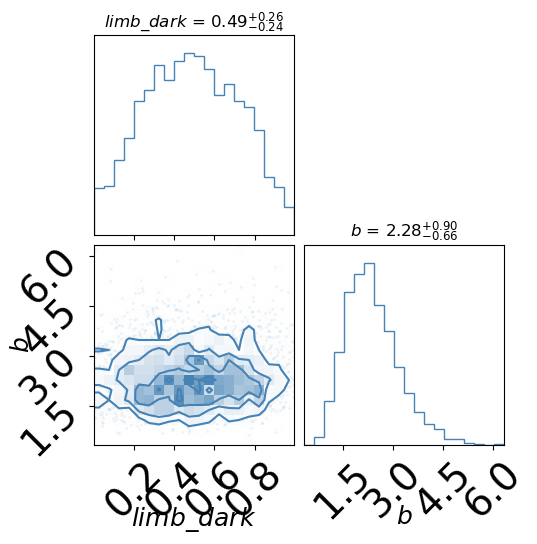

In [30]:
from corner import corner

colors = ['orange', 'red', 'purple', 'blue', 'green', 'darkgreen', 'steelblue', 'pink']

figure = None

epochs = [200, 300, 200, 500, 300, 600, 600, 300, 500]
for j, i in enumerate([ 5, 8, 9, 10, 11, 13, 15, 18]):
    if j < 6 :
        continue
    if j > 6:
        break
    runpath = datapath / ('logNormnoise_'+ str(i)) #'honest-totem-81'
    ep = epochs[j]
    savepath = runpath/ ('plots_' + str(ep))
    print(savepath)

    df_theta = pd.read_csv(savepath/'theta.csv')
    theta = df_theta.values
    theta = torch.from_numpy(theta)
#     print(theta)
    th_df = pd.DataFrame(theta[:2991])
    
    figure = corner(th_df.values[:,-2:], fig=figure, color = colors[j], labels = LABELS[-2:], show_titles=True,
    title_kwargs={"fontsize": 12})
#     

plt.show()

## comparing diff corners all 16 params

In [31]:
from corner import corner

colors = ['orange', 'red', 'purple', 'blue', 'green', 'darkgreen', 'steelblue', 'pink']
figure = None

epochs = [200, 300, 200, 500, 300, 600, 600, 600, 500]
for j, i in enumerate([ 5, 15, 8, 9, 10, 11, 13, 15, 18]):
    if j == 0:
        continue
    runpath = datapath / ('logNormnoise_'+ str(i)) #'honest-totem-81'
    ep = epochs[j]
    savepath = runpath/ ('plots_' + str(ep))
    print(savepath)

    df_theta = pd.read_csv(savepath/'theta.csv')
    theta = df_theta.values
    theta = torch.from_numpy(theta)
#     print(theta)
    th_df = pd.DataFrame(theta[:2991])
    
    corner(th_df.values, fig=figure, color = colors[j], labels = LABELS, show_titles=True,
    title_kwargs={"fontsize": 12})
    
#     if j > 1:
#         break
    
plt.show()

/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_15/plots_300
/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_8/plots_200


KeyboardInterrupt: 

## comparing corners 11 parameters

/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_5/plots_200
/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_8/plots_200
/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_9/plots_500
/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_10/plots_300
/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_11/plots_600
/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_13/plots_600
/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_15/plots_300
/scratch/users/mvasist/highres-sbi/runs/sweep_lognormnoise/logNormnoise_18/plots_500


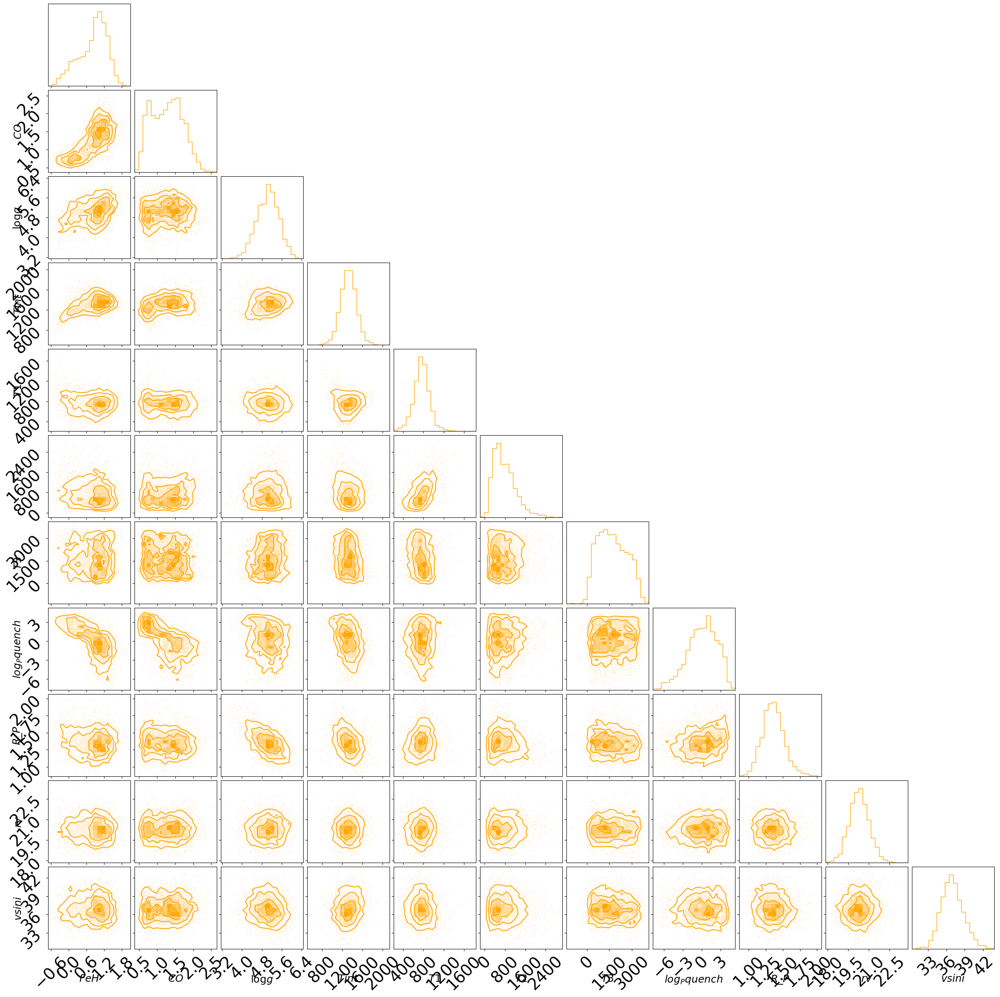

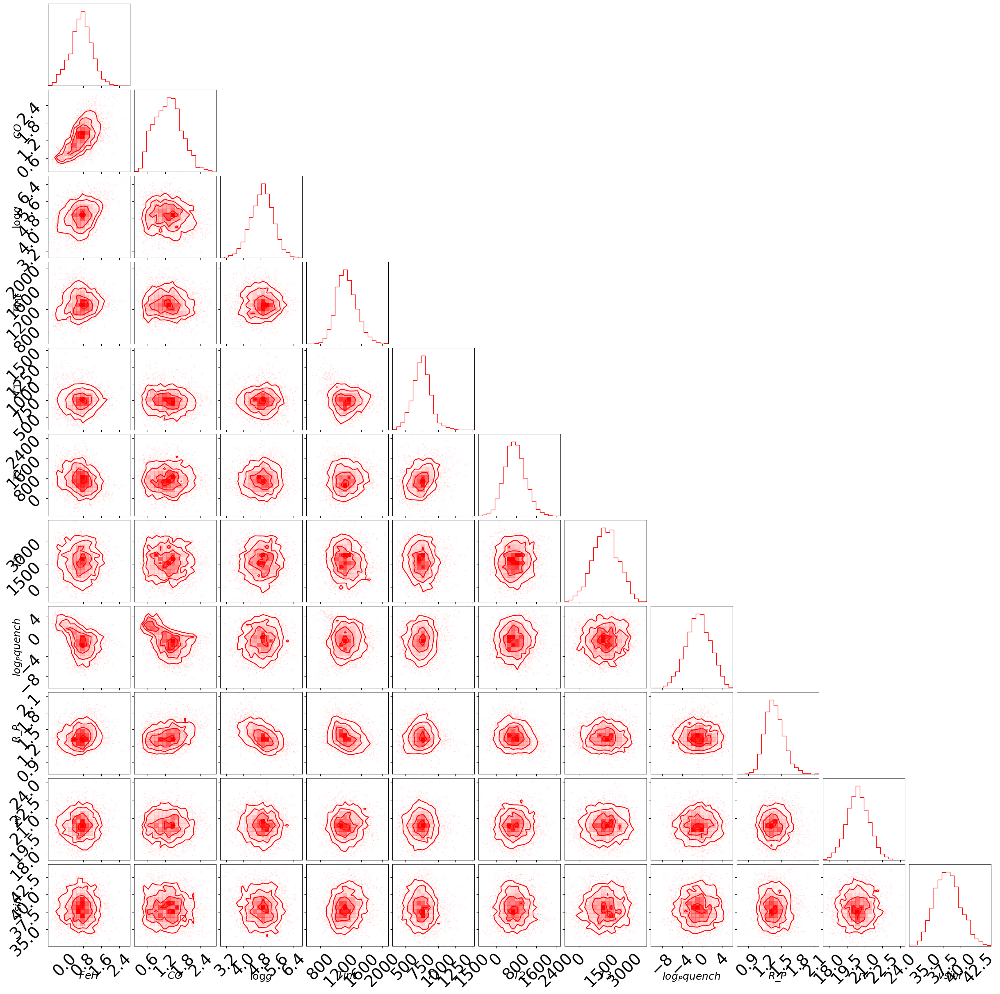

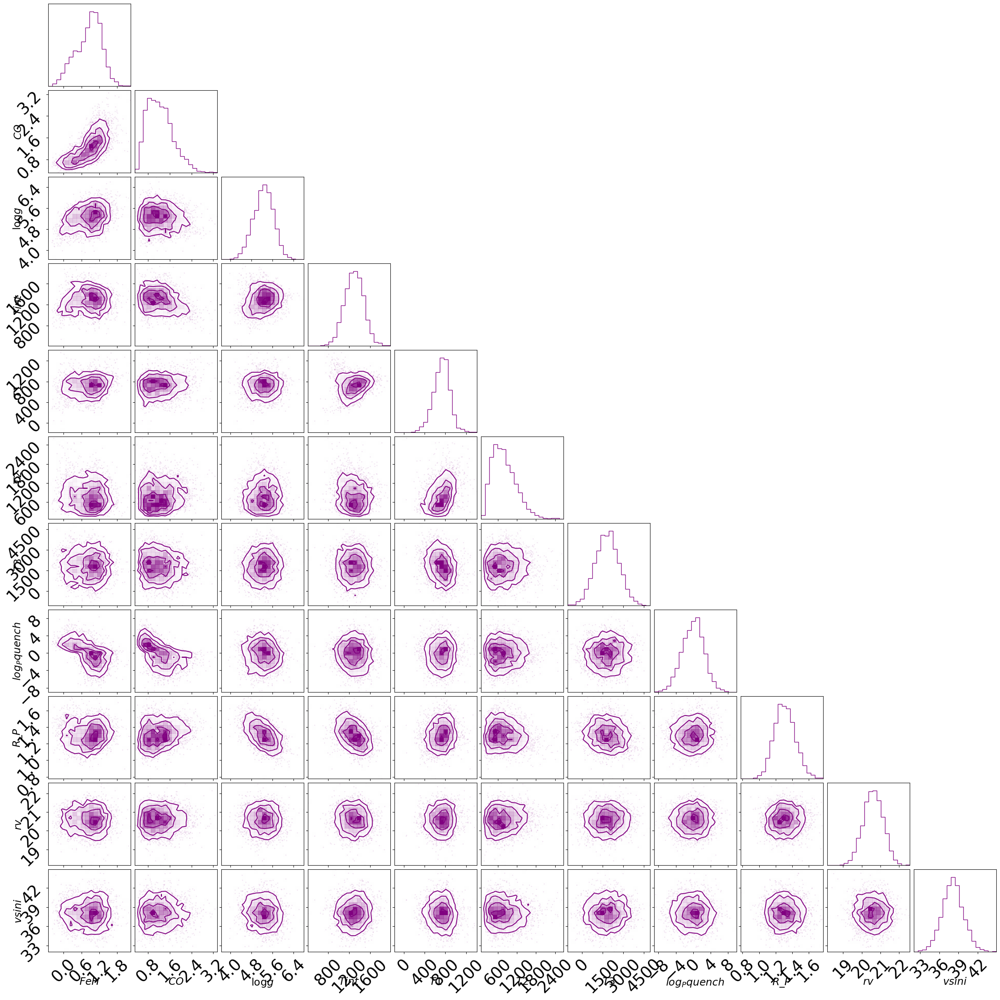

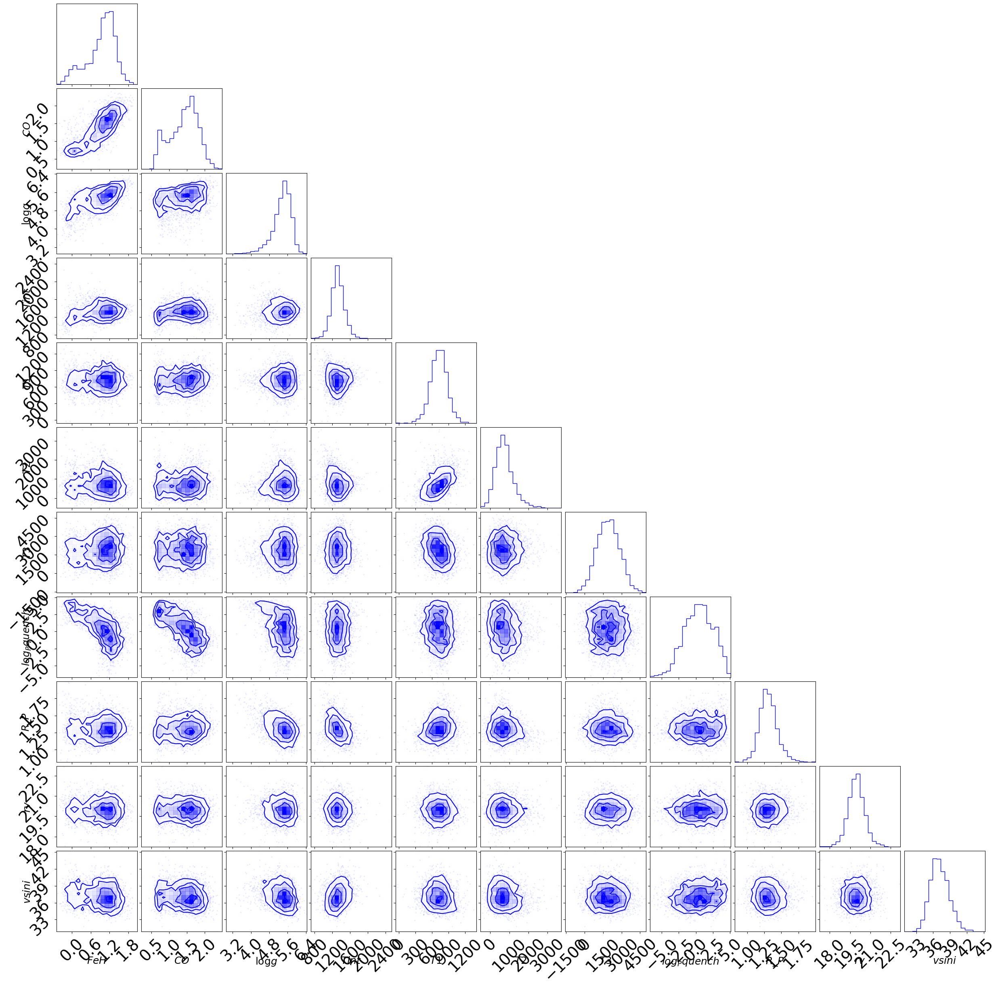

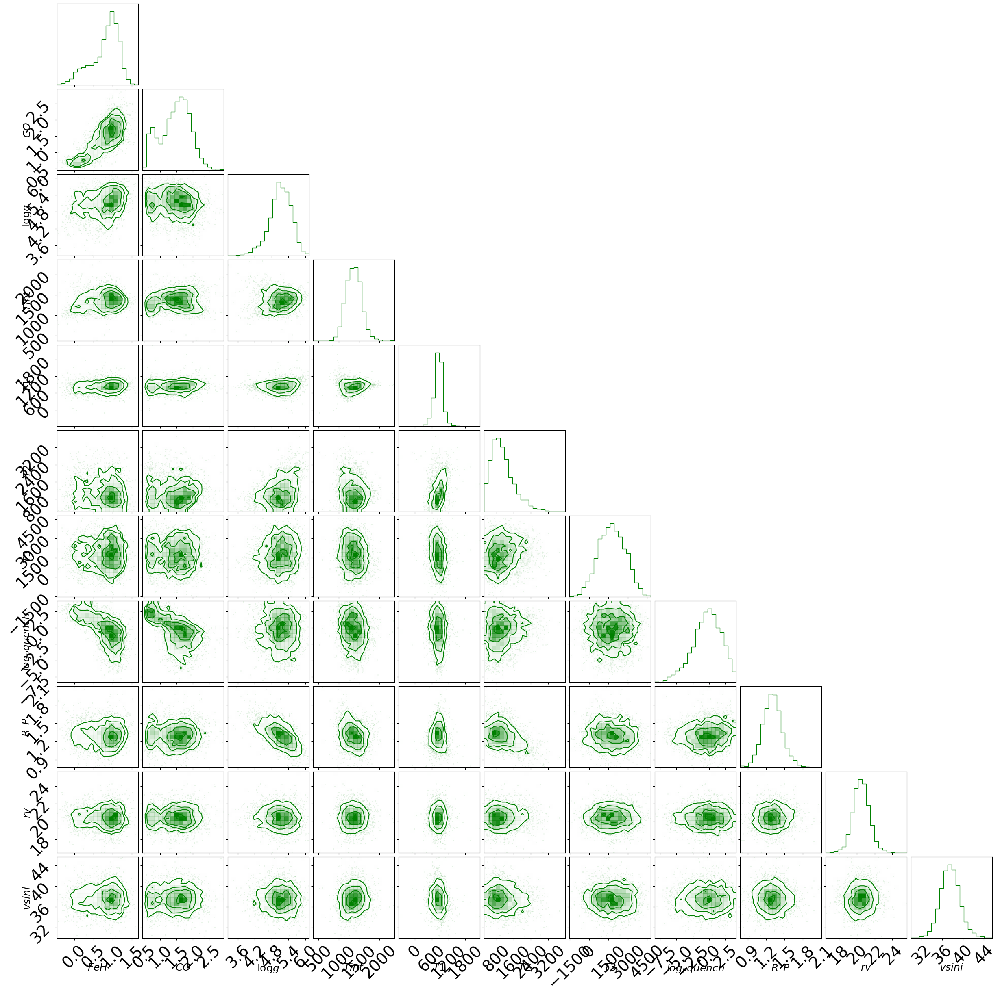

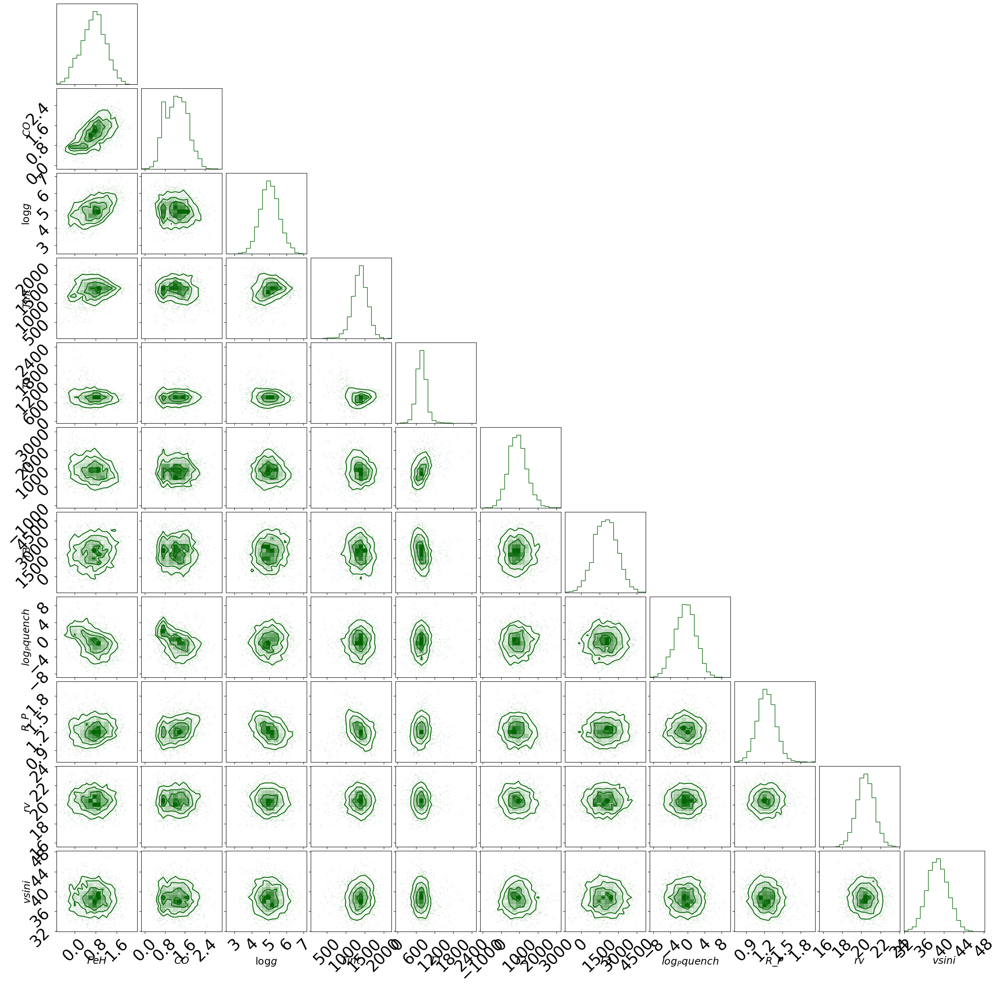

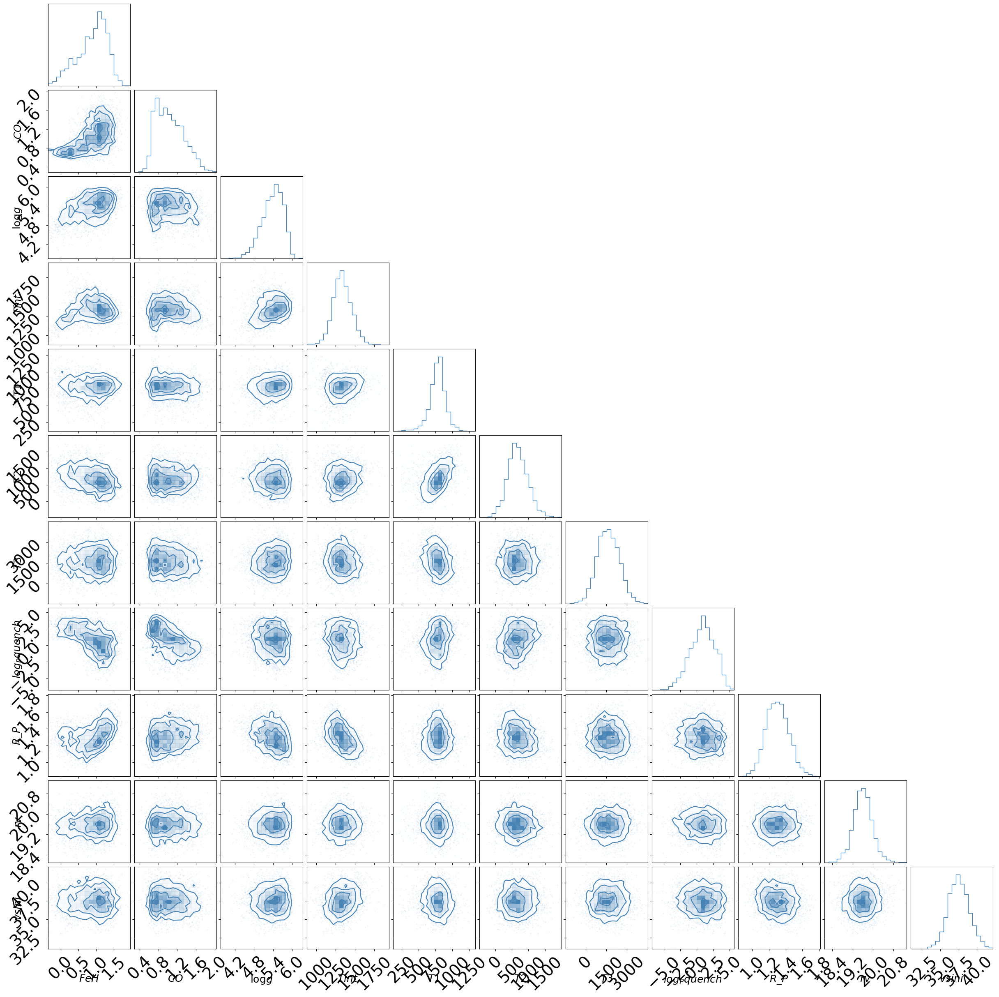

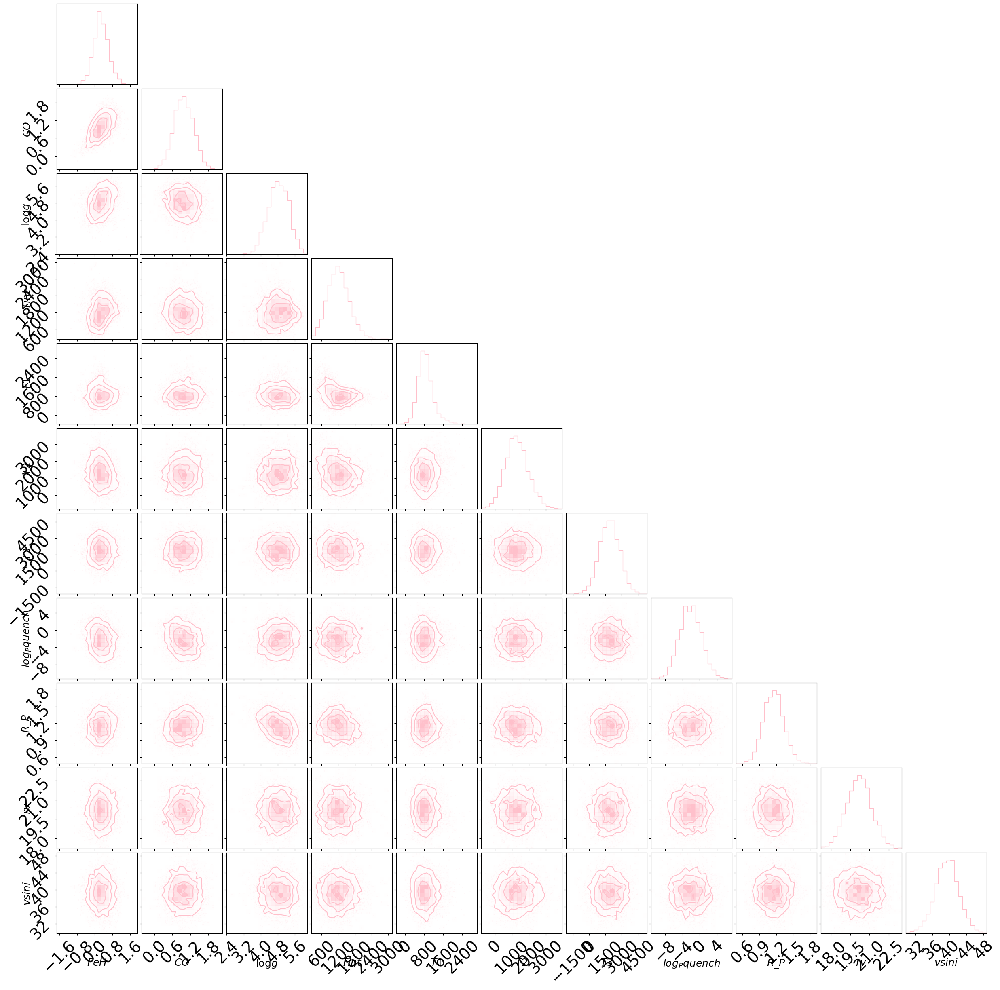

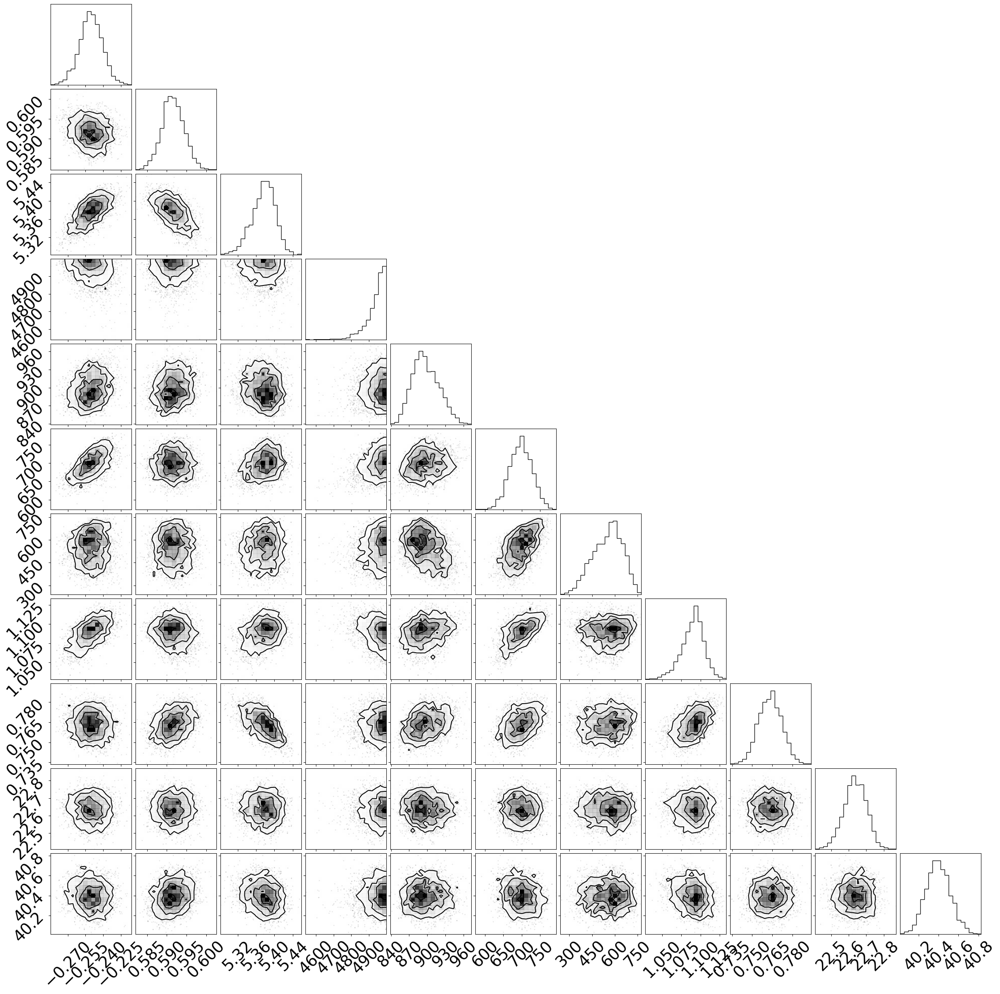

In [23]:
from corner import corner

colors = ['orange', 'red', 'purple', 'blue', 'green', 'darkgreen', 'steelblue', 'pink']
figure = None

epochs = [ 200, 200, 500, 300, 600, 600, 300, 500]
for j, i in enumerate([ 5, 8, 9, 10, 11, 13, 15, 18]):
    runpath = datapath / ('logNormnoise_'+ str(i)) #'honest-totem-81'
    ep = epochs[j]
    savepath = runpath/ ('plots_' + str(ep))
    print(savepath)

    df_theta = pd.read_csv(savepath/'theta.csv')
    theta = df_theta.values
    theta = torch.from_numpy(theta)
#     print(theta)
    th_df = pd.DataFrame(theta[:2991])
    
    th_df_ = th_df.drop( columns= [7, 8, 10, 14, 15 ], axis=1)
    corner(th_df_.values, fig=figure, color = colors[j], labels = labels_ind, show_titles=True,
    title_kwargs={"fontsize": 12})
    
    if j <= 5:
        continue
    
corner(th_df_sam.values, fig=figure, color = 'black')

plt.show()

## Plotting both old and new

In [17]:
data = np.loadtxt('/home/mvasist/Highres/Sam/obs/spectrum_obs_old_ergscm2nm/data_to_fit.dat')
np.shape(data)
pd.DataFrame(data)

,0,1,2,3,4
0,2321.520768,NaN,1.069594e-13,0.007950,NaN
1,2321.528718,NaN,6.777652e-14,0.007950,NaN
2,2321.536668,NaN,5.471157e-14,0.007950,NaN
3,2321.544618,NaN,3.899699e-16,0.007950,NaN
4,2321.552568,NaN,3.454707e-16,0.007950,NaN
...,...,...,...,...,...
6139,2369.420671,NaN,1.594134e-15,0.006896,NaN
6140,2369.427567,NaN,4.400819e-14,0.006896,NaN
6141,2369.434463,NaN,4.640135e-14,0.006896,NaN
6142,2369.441359,NaN,5.031957e-14,0.006896,NaN


In [30]:
# Highres/Sam/obs/DENIS_J0255_ergscm2nm
# Highres/observation/data/
import numpy as np 

# wv1 = np.load('/home/mvasist/Highres/Sam/obs/DENIS_J0255_ergscm2nm/d_spec_wave.npy')
# fl1 = np.load('/home/mvasist/Highres/Sam/obs/DENIS_J0255_ergscm2nm/d_spec_flux.npy') 
# err1 = np.load('/home/mvasist/Highres/Sam/obs/DENIS_J0255_ergscm2nm/d_spec_err.npy')
# pp = pd.DataFrame(np.stack(( wv1[0].flatten(), fl1[0].flatten(), err1[0].flatten() ))).T
# pp
# np.savetxt('/home/mvasist/Highres/Sam/obs/DENIS_J0255_ergscm2nm/data_to_fit.dat', pp)

In [31]:
data1 = np.loadtxt('/home/mvasist/Highres/Sam/obs/DENIS_J0255_ergscm2nm/data_to_fit.dat')
np.shape(data1)
pd.DataFrame(data1)

,0,1,2
0,2321.538468,NaN,NaN
1,2321.546422,NaN,NaN
2,2321.554376,NaN,NaN
3,2321.562330,NaN,NaN
4,2321.570284,NaN,NaN
...,...,...,...
6139,2369.441871,NaN,NaN
6140,2369.448770,NaN,NaN
6141,2369.455670,NaN,NaN
6142,2369.462569,NaN,NaN


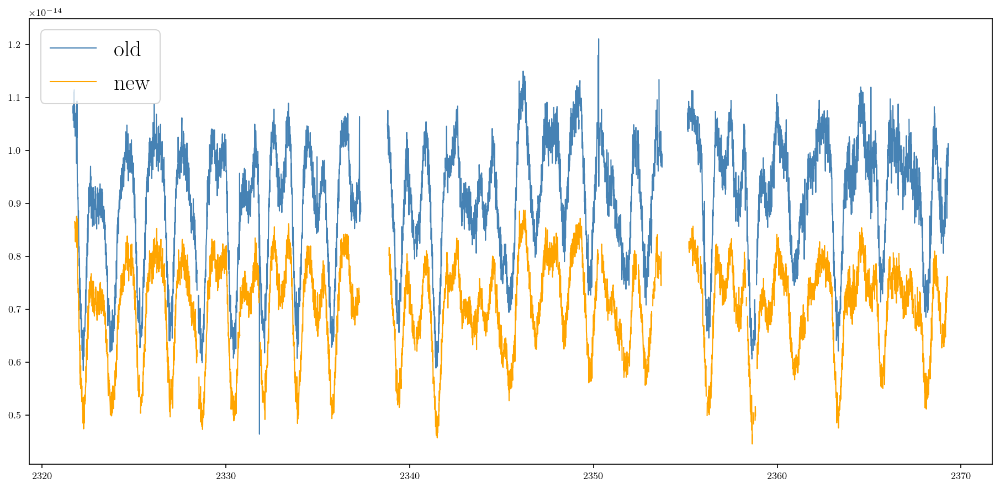

In [32]:
plt.figure(figsize=(15,7))
plt.plot( data[:,0], data[:,1], color='steelblue', label= 'old')
plt.plot( data1[:,0], data1[:,1], color='orange', label = 'new')
plt.legend(fontsize=20)
plt.show()

In [33]:
d = Data(path= '/home/mvasist/Highres/Sam/obs/spectrum_obs_old_ergscm2nm/data_to_fit.dat')
d1 = Data()

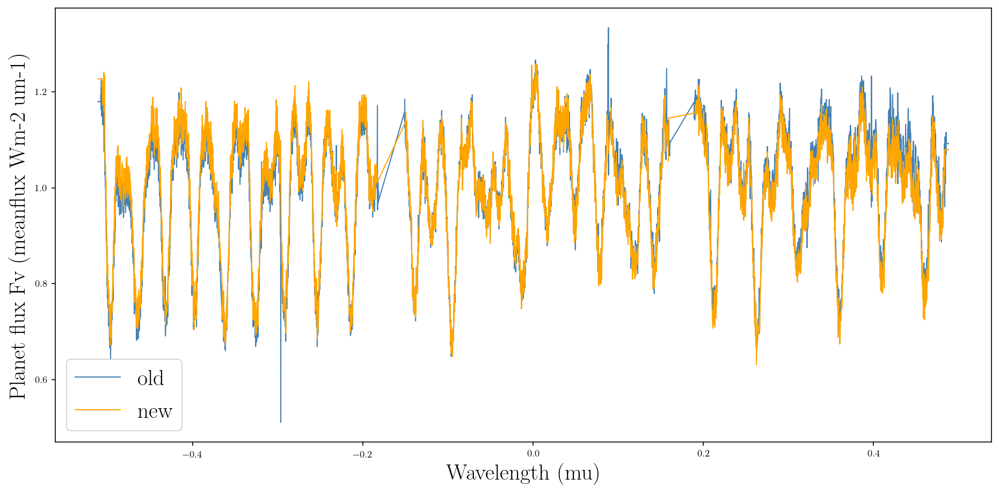

In [40]:
plt.rcParams.update(nice_rc(latex=True))
plt.figure(figsize=(15,7))
# plt.errorbar(x[0, 1], x[0,0], yerr= d.err**d.flux_scaling*25, color = 'steelblue', label = 'betsfit')
plt.plot(d.data_wavelengths_norm, d.flux*d.flux_scaling, color = 'steelblue',  label= 'old')
plt.plot(d1.data_wavelengths_norm, d1.flux*d1.flux_scaling, color = 'orange',  label= 'new')

plt.xlabel('Wavelength (mu)', fontsize = 20)
plt.ylabel('Planet flux Fv (meanflux Wm-2 um-1)', fontsize= 20)
# plt.xlim(-0.1, 0.1)
plt.legend(fontsize=20)

plt.show()


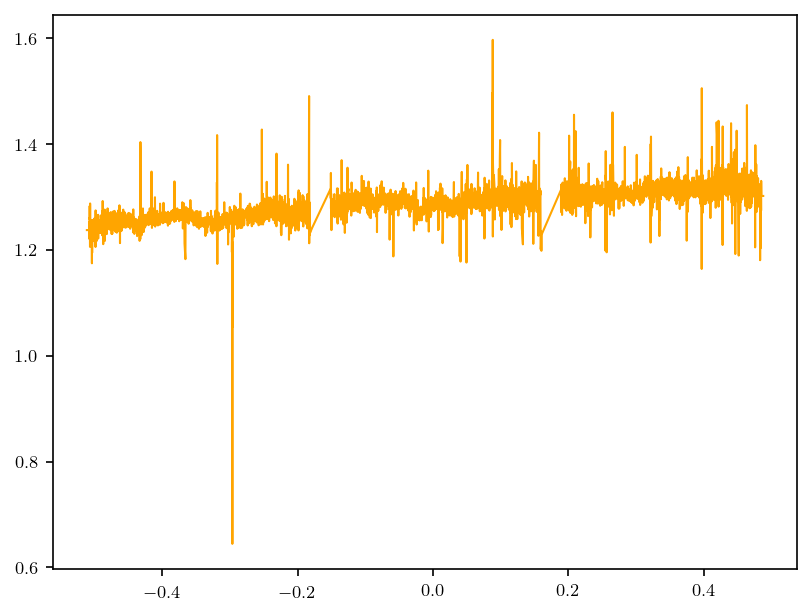

In [35]:
plt.plot(d1.data_wavelengths_norm, d.flux/ d1.flux, color = 'orange')
plt.show()